##Install Libs

In [ ]:
!pip install ISLP
!pip install l0bnb
!pip install prince
!pip install mca
!pip install pyBART

In [ ]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
from statsmodels.api import OLS
import sklearn.model_selection as skm
import sklearn.linear_model as skl
from sklearn.preprocessing import StandardScaler
from ISLP import load_data
from ISLP.models import ModelSpec as MS
from functools import partial
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from ISLP.models import Stepwise, sklearn_selected, sklearn_selection_path
from l0bnb import fit_path
from sklearn.metrics import accuracy_score, log_loss
from sklearn.ensemble import RandomForestRegressor as RF, GradientBoostingRegressor as GBR
from ISLP.bart import BART
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, log_loss, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree


## Import data into DFs

In [ ]:
file_name = 'SCFP2022.xlsx'
df = pd.read_excel(file_name)
df = df.drop(columns=['Y1', 'YY1','WILSH','WGT'])

master_df = df

## Convert to Risk Aversion Measures

In [ ]:
def calculate_risk_aversion(row):
    if row['YESFINRISK'] == 0 and row['NOFINRISK'] == 1:
        return 'HIGH'
    elif row['YESFINRISK'] == 1 and row['NOFINRISK'] == 0:
        return 'LOW'
    elif row['YESFINRISK'] == 0 and row['NOFINRISK'] == 0:
        return 'MID'
    else:
        return None  # Optional: Handle unexpected cases

# Apply the function to create the RISKAVERSION column
master_df['RISKAVERSION'] = master_df.apply(calculate_risk_aversion, axis=1)
master_df.head()



,HHSEX,AGE,AGECL,EDUC,EDCL,MARRIED,KIDS,LF,LIFECL,FAMSTRUCT,...,INCCAT,ASSETCAT,NINCCAT,NINC2CAT,NWPCTLECAT,INCPCTLECAT,NINCPCTLECAT,INCQRTCAT,NINCQRTCAT,RISKAVERSION
0,2,70,5,9,3,2,2,0,6,1,...,2,4,2,1,8,3,3,2,1,MID
1,2,70,5,9,3,2,2,0,6,1,...,2,5,2,1,8,3,3,2,1,MID
2,2,70,5,9,3,2,2,0,6,1,...,2,4,2,1,8,3,3,1,1,MID
3,2,70,5,9,3,2,2,0,6,1,...,2,4,1,1,6,3,2,1,1,MID
4,2,70,5,9,3,2,2,0,6,1,...,2,4,2,1,8,3,3,1,1,MID


In [ ]:
## only use when ready to restrict
desired_columns = [
    'RISKAVERSION',
    'INCPCTLECAT',
    'KNOWL',
    'FINLIT',
    'YESFINRISK',
    'NOFINRISK',
    'CKCONNECTN',
    'CKCONVPAYRL',
    'CKLOCATION',
    'CKLONGTIME',
    'CKLOWFEEBAL',
    'CKMANYSVCS',
    'CKPERSONAL',
    'CKRECOMFRND',
    'CKSAFETY',
    'CKOTHCHOOSE',
    'MINBAL',
    'CANTMANG',
    'CREDIT',
    'DONTLIKE',
    'DONTWANT',
    'DONTWRIT',
    'NOMONEY',
    'SVCCHG',
    'OTHER',
    'WHYNOCKG',
    'SAVRES1',
    'SAVRES2',
    'SAVRES3',
    'SAVRES4',
    'SAVRES5',
    'SAVRES6',
    'SAVRES7',
    'SAVRES8',
    'SAVRES9',
    'SAVED',
    'WSAVED',
    'SPENDMOR',
    'SPENDLESS',
    'EHCHKG',
    # Additional columns
    'BSHOPGRDL',
    'BSHOPMODR',
    'BSHOPNONE',
    'ISHOPGRDL',
    'ISHOPMODR',
    'ISHOPNONE',
    'BCALL',
    'BDONT',
    'BFINPLAN',
    'BFINPRO',
    'BFRIENDWORK',
    'BINTERNET',
    'BMAGZNEWS',
    'BMAILADTV',
    'BSELF',
    'BOTHER',
    'ICALL',
    'IDONT',
    'IFINPLAN',
    'IFINPRO',
    'IFRIENDWORK',
    'IINTERNET',
    'IMAGZNEWS',
    'IMAILADTV',
    'ISELF',
    'IOTHER',
    'INTERNET'
]

master_df = master_df[desired_columns]

In [ ]:
y = master_df['RISKAVERSION']
X = master_df.drop(columns=['RISKAVERSION','NOFINRISK','YESFINRISK'])

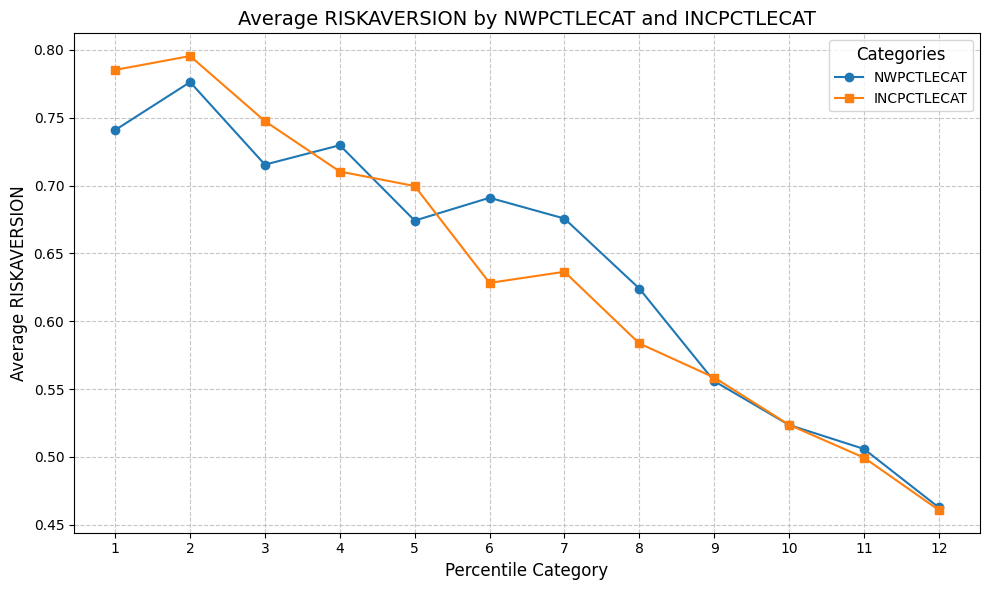

In [ ]:
#NWPCTLECAT
#INCPCTLECAT
#RISKAVERSION
dff = df

def calculate_risk_aversion_2(row):
    if row['YESFINRISK'] == 0 and row['NOFINRISK'] == 1:
        return 1
    elif row['YESFINRISK'] == 1 and row['NOFINRISK'] == 0:
        return 0
    elif row['YESFINRISK'] == 0 and row['NOFINRISK'] == 0:
        return 0.5
    else:
        return None  # Optional: Handle unexpected cases

# Apply the function to create the RISKAVERSION column
dff['RISKAVERSION'] = dff.apply(calculate_risk_aversion_2, axis=1)



import matplotlib.pyplot as plt

# Calculate average RISKAVERSION for each value of NWPCTLECAT and INCPCTLECAT
avg_nw = dff.groupby('NWPCTLECAT')['RISKAVERSION'].mean()
avg_inc = dff.groupby('INCPCTLECAT')['RISKAVERSION'].mean()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(avg_nw.index, avg_nw.values, marker='o', label='NWPCTLECAT')
plt.plot(avg_inc.index, avg_inc.values, marker='s', label='INCPCTLECAT')

# Enhancing the chart aesthetics
plt.title('Average RISKAVERSION by NWPCTLECAT and INCPCTLECAT', fontsize=14)
plt.xlabel('Percentile Category', fontsize=12)
plt.ylabel('Average RISKAVERSION', fontsize=12)
plt.xticks(avg_nw.index, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Categories', fontsize=10, title_fontsize=12)
plt.grid(visible=True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
y_crra

NameError: name 'y_crra' is not defined


NWPCTLECAT Model Summary:
                            OLS Regression Results                            
Dep. Variable:           RISKAVERSION   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     113.9
Date:                Sun, 24 Nov 2024   Prob (F-statistic):           8.74e-07
Time:                        13:58:32   Log-Likelihood:                 25.814
No. Observations:                  12   AIC:                            -47.63
Df Residuals:                      10   BIC:                            -46.66
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8185    

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


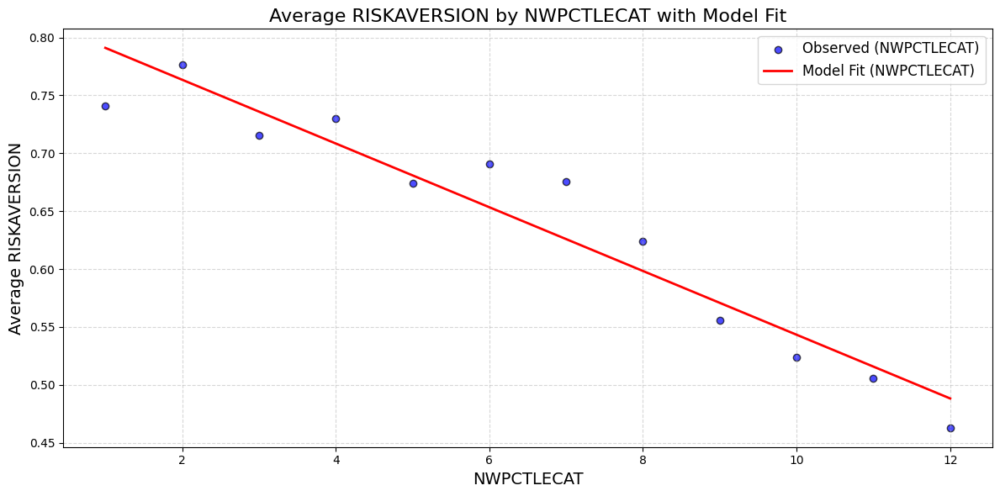

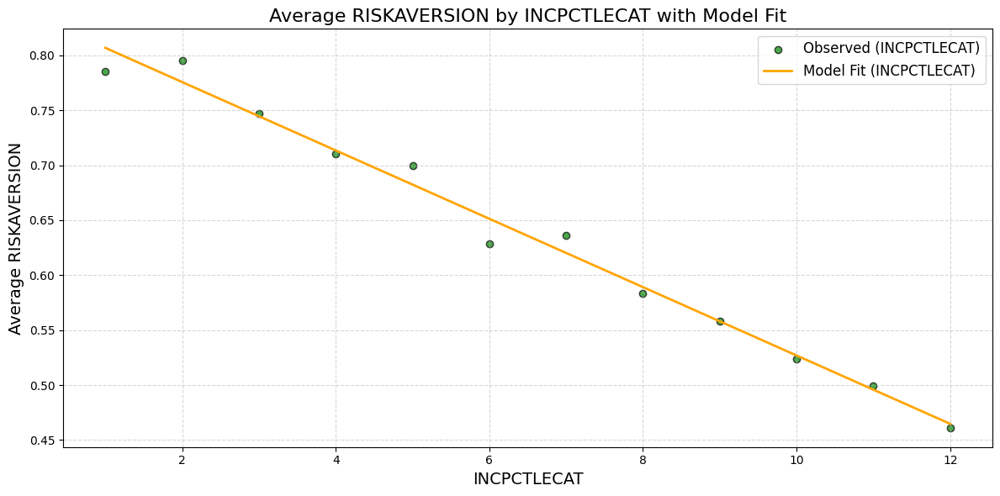

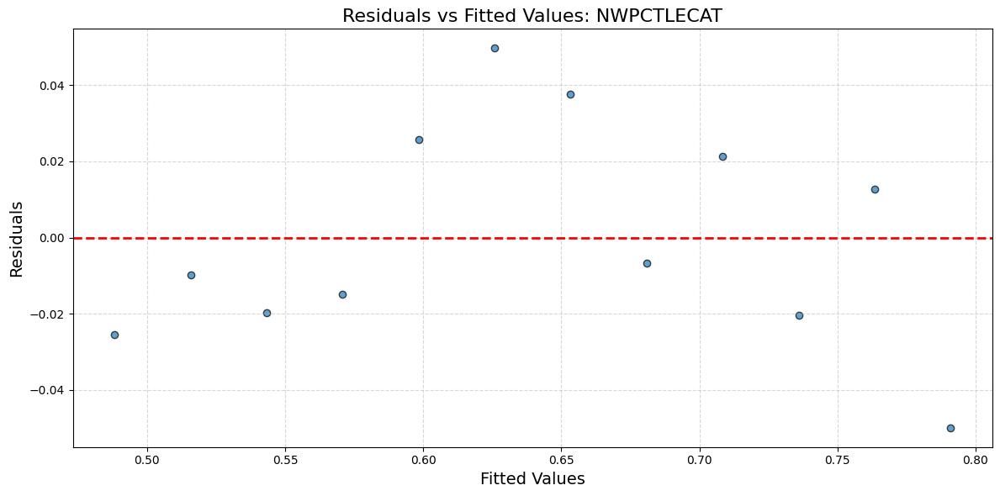

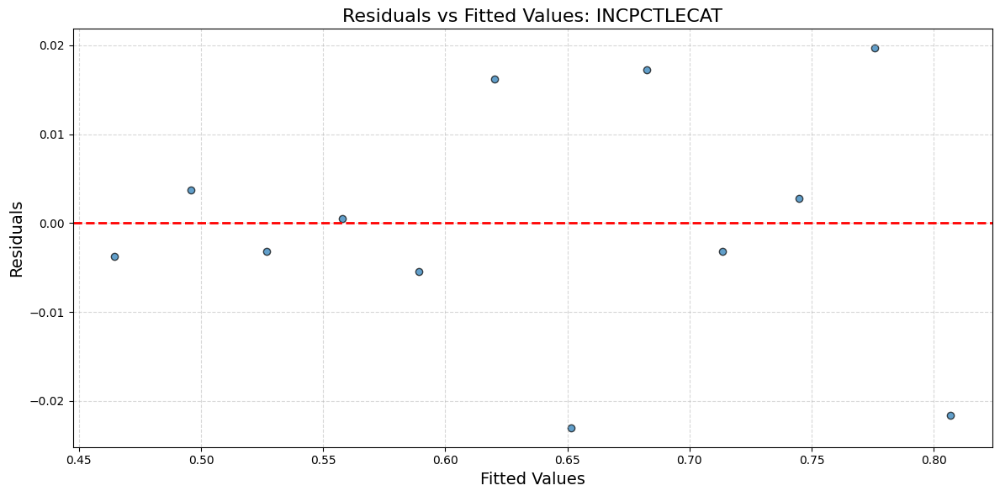

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np

# Group data and compute averages
nw_avg = dff.groupby('NWPCTLECAT')['RISKAVERSION'].mean().reset_index()
inc_avg = dff.groupby('INCPCTLECAT')['RISKAVERSION'].mean().reset_index()

# Prepare data for modeling (NWPCTLECAT)
X_nw = nw_avg['NWPCTLECAT']  # Independent variable
y_nw = nw_avg['RISKAVERSION']  # Dependent variable

# Prepare data for modeling (INCPCTLECAT)
X_inc = inc_avg['INCPCTLECAT']  # Independent variable
y_inc = inc_avg['RISKAVERSION']  # Dependent variable

# Add constant for OLS regression
X_nw_ols = sm.add_constant(X_nw)
X_inc_ols = sm.add_constant(X_inc)

# Fit OLS models
nw_model = sm.OLS(y_nw, X_nw_ols).fit()
inc_model = sm.OLS(y_inc, X_inc_ols).fit()

# Predict values
nw_pred = nw_model.predict(X_nw_ols)
inc_pred = inc_model.predict(X_inc_ols)

# Diagnostic metrics
def print_model_summary(model, label):
    print(f"\n{label} Model Summary:")
    print(model.summary())

print_model_summary(nw_model, "NWPCTLECAT")
print_model_summary(inc_model, "INCPCTLECAT")

# Visualization for NWPCTLECAT
plt.figure(figsize=(12, 6))
plt.scatter(X_nw, y_nw, label='Observed (NWPCTLECAT)', color='blue', alpha=0.7, edgecolor='k')
plt.plot(X_nw, nw_pred, label='Model Fit (NWPCTLECAT)', color='red', linewidth=2)
plt.title('Average RISKAVERSION by NWPCTLECAT with Model Fit', fontsize=16)
plt.xlabel('NWPCTLECAT', fontsize=14)
plt.ylabel('Average RISKAVERSION', fontsize=14)
plt.legend(fontsize=12)
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Visualization for INCPCTLECAT
plt.figure(figsize=(12, 6))
plt.scatter(X_inc, y_inc, label='Observed (INCPCTLECAT)', color='green', alpha=0.7, edgecolor='k')
plt.plot(X_inc, inc_pred, label='Model Fit (INCPCTLECAT)', color='orange', linewidth=2)
plt.title('Average RISKAVERSION by INCPCTLECAT with Model Fit', fontsize=16)
plt.xlabel('INCPCTLECAT', fontsize=14)
plt.ylabel('Average RISKAVERSION', fontsize=14)
plt.legend(fontsize=12)
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Residual analysis
def plot_residuals(y, y_pred, title):
    residuals = y - y_pred
    plt.figure(figsize=(12, 6))
    plt.scatter(y_pred, residuals, alpha=0.7, edgecolor='k')
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.title(f'Residuals vs Fitted Values: {title}', fontsize=16)
    plt.xlabel('Fitted Values', fontsize=14)
    plt.ylabel('Residuals', fontsize=14)
    plt.grid(visible=True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Residual plots
plot_residuals(y_nw, nw_pred, "NWPCTLECAT")
plot_residuals(y_inc, inc_pred, "INCPCTLECAT")


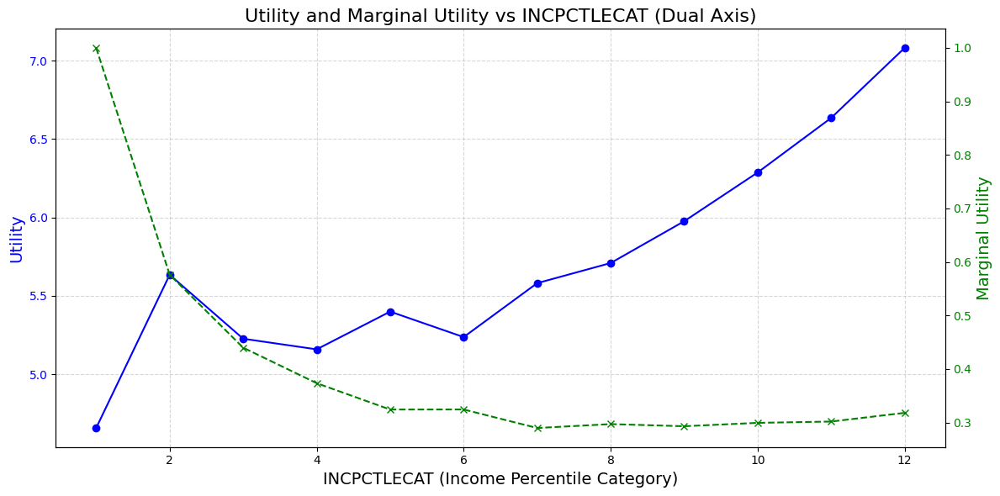

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Sample dataset for demonstration (replace with your actual dataset)

# Compute utility and marginal utility
def compute_utility_and_marginal(c, theta):
    if theta == 1:
        utility = np.log(c)  # Logarithmic utility when theta = 1
    else:
        utility = (c ** (1 - theta)) / (1 - theta)
    marginal_utility = c ** -theta  # Marginal utility
    return utility, marginal_utility

# Apply to dataset
inc_avg[['UTILITY', 'MARGINAL_UTILITY']] = inc_avg.apply(
    lambda row: pd.Series(compute_utility_and_marginal(row['INCPCTLECAT'], row['RISKAVERSION'])),
    axis=1
)
# Plot utility and marginal utility with dual y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot utility on the left y-axis
ax1.set_xlabel('INCPCTLECAT (Income Percentile Category)', fontsize=14)
ax1.set_ylabel('Utility', fontsize=14, color='blue')
ax1.plot(inc_avg['INCPCTLECAT'], inc_avg['UTILITY'], marker='o', linestyle='-', color='blue', label='Utility')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(visible=True, linestyle='--', alpha=0.5)

# Create a second y-axis for marginal utility
ax2 = ax1.twinx()
ax2.set_ylabel('Marginal Utility', fontsize=14, color='green')
ax2.plot(inc_avg['INCPCTLECAT'], inc_avg['MARGINAL_UTILITY'], marker='x', linestyle='--', color='green', label='Marginal Utility')
ax2.tick_params(axis='y', labelcolor='green')

# Title and layout
plt.title('Utility and Marginal Utility vs INCPCTLECAT (Dual Axis)', fontsize=16)
fig.tight_layout()

plt.show()


##PCR


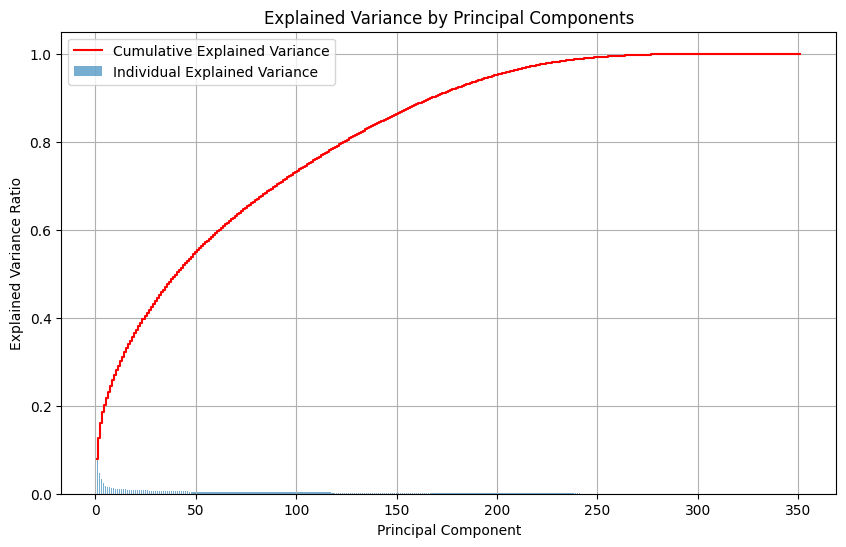

Mean Squared Error: 0.05464105367904314
R-squared: 0.2549051488822641

Variable Importance (Loadings for each Principal Component):
                   PC1       PC2       PC3       PC4       PC5       PC6  \
HHSEX        -0.072358  0.062988 -0.013074  0.011796  0.008306 -0.027242   
AGE           0.058995  0.002275 -0.103218  0.185050  0.012820 -0.174692   
AGECL         0.057833  0.003149 -0.103326  0.183966  0.013533 -0.174796   
EDUC          0.097231 -0.085821  0.016950 -0.023096 -0.062656  0.059658   
EDCL          0.094620 -0.083305  0.017749 -0.021619 -0.060789  0.061766   
...                ...       ...       ...       ...       ...       ...   
NWPCTLECAT    0.153562 -0.095184 -0.036521  0.082285  0.010776  0.003248   
INCPCTLECAT   0.149926 -0.106752  0.006868 -0.011426 -0.033999  0.072450   
NINCPCTLECAT  0.152290 -0.105638  0.008214 -0.015933 -0.017258  0.075448   
INCQRTCAT     0.135876 -0.118977  0.021768 -0.021193 -0.045908  0.056899   
NINCQRTCAT    0.137405 -0.117678

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

y = master_df['RISKAVERSION']
X = master_df.drop(columns=['RISKAVERSION','NOFINRISK','YESFINRISK'])
# Step 1: Standardize the independent variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Perform PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Use only the first 10 components
n_components = 10
X_pca_reduced = X_pca[:, :n_components]

# Plot the explained variance and cumulative explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(10, 6))
components = range(1, len(explained_variance) + 1)

# Plot individual explained variance
plt.bar(components, explained_variance, alpha=0.6, label='Individual Explained Variance')

# Plot cumulative explained variance
plt.step(components, cumulative_variance, where='mid', label='Cumulative Explained Variance', color='red')

# Add labels and title
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.legend(loc='best')
plt.grid(True)

plt.show()

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca_reduced, y, test_size=0.2, random_state=42)

# Step 3: Train the linear regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Predict on test set
y_pred = regressor.predict(X_test)

# Step 4: Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Recover original variable contributions
loadings = pca.components_[:n_components]  # Loadings for selected components
variable_importance = pd.DataFrame(loadings.T, index=X.columns, columns=[f'PC{i+1}' for i in range(n_components)])

# Add explained variance as a separate DataFrame for the selected components
explained_variance_df = pd.DataFrame(
    explained_variance[:n_components],
    index=[f'PC{i+1}' for i in range(n_components)],
    columns=['Explained Variance']
)

# Display variable importance and explained variance
print("\nVariable Importance (Loadings for each Principal Component):")
print(variable_importance)

print("\nExplained Variance for each Principal Component:")
print(explained_variance_df)

# Save results to CSV if needed
variable_importance.to_csv("variable_importance_pca.csv", index=True)
explained_variance_df.to_csv("explained_variance_pca.csv", index=True)

##Model Run (ADA Boost)

In [ ]:
y

,RISKAVERSION
0,MID
1,MID
2,MID
3,MID
4,MID
...,...
22970,HIGH
22971,HIGH
22972,HIGH
22973,HIGH


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy: 0.8645
Log Loss (Cross-Entropy Loss): 0.3785

Classification Report:
              precision    recall  f1-score   support

        HIGH       0.81      0.79      0.80      2163
         LOW       0.97      0.72      0.83       356
         MID       0.88      0.91      0.90      4374

    accuracy                           0.86      6893
   macro avg       0.89      0.81      0.84      6893
weighted avg       0.87      0.86      0.86      6893



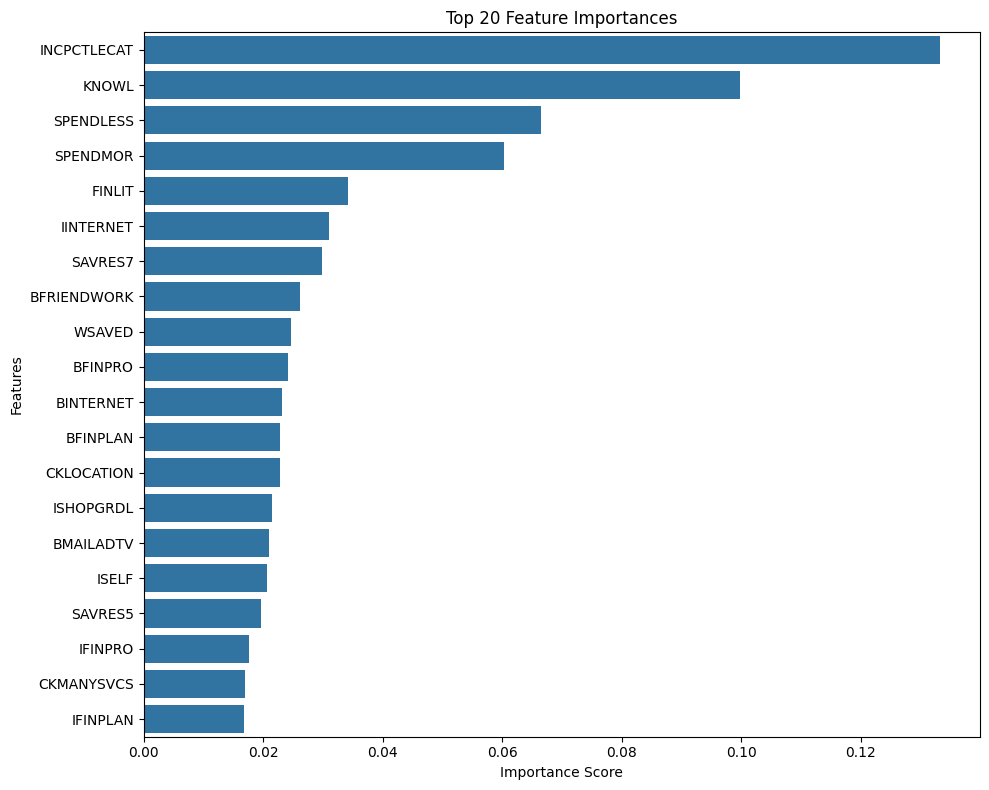

In [ ]:
from sklearn.metrics import classification_report

#y = master_df['INCPCTLECAT']
#X = master_df.drop(columns=['INCPCTLECAT','NOFINRISK','YESFINRISK','INCCAT','INCOME','INCQRTCAT','NORMINC','NINCPCTLECAT'])

y = master_df['RISKAVERSION']
#X = master_df.drop(columns=['RISKAVERSION','NOFINRISK','YESFINRISK'])
X = master_df.drop(columns=['RISKAVERSION','NOFINRISK','YESFINRISK'])

# Set random seed for reproducibility
np.random.seed(0)

# Encode target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

# -------------------------------
# Model Training
# -------------------------------
# Initialize the base estimator with Gini impurity
base_estimator = DecisionTreeClassifier(criterion='gini', max_depth=7, random_state=42) #max_leaf_nodes=9 #max_leaf_nodes=12,

# Initialize the AdaBoost classifier
ada_classifier = AdaBoostClassifier(
    estimator=base_estimator,
    n_estimators=15,
    random_state=44
)

# Train the model
ada_classifier.fit(X_train, y_train)

# -------------------------------
# Model Evaluation
# -------------------------------
# Predict on test data
y_pred = ada_classifier.predict(X_test)
y_pred_proba = ada_classifier.predict_proba(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

# Compute log loss (cross-entropy loss)
logloss = log_loss(y_test, y_pred_proba)
print(f'Log Loss (Cross-Entropy Loss): {logloss:.4f}')

# Display classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

target_names=label_encoder.classes_

# -------------------------------
# Feature Importance Visualization
# -------------------------------
# Get feature importances
feature_importances = ada_classifier.feature_importances_

# Create a dataframe for feature importances
feat_importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the dataframe by importance
feat_importances_df = feat_importances_df.sort_values('Importance', ascending=False)

# Plot the top 20 features
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feat_importances_df.head(20))
plt.title('Top 20 Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

# -------------------------------
# Plotting the Final Tree
# -------------------------------
# Since AdaBoost uses multiple estimators, we can visualize one of them
# Let's plot the final estimator (last tree)

# Get the final estimator
final_estimator = ada_classifier.estimators_[-1]

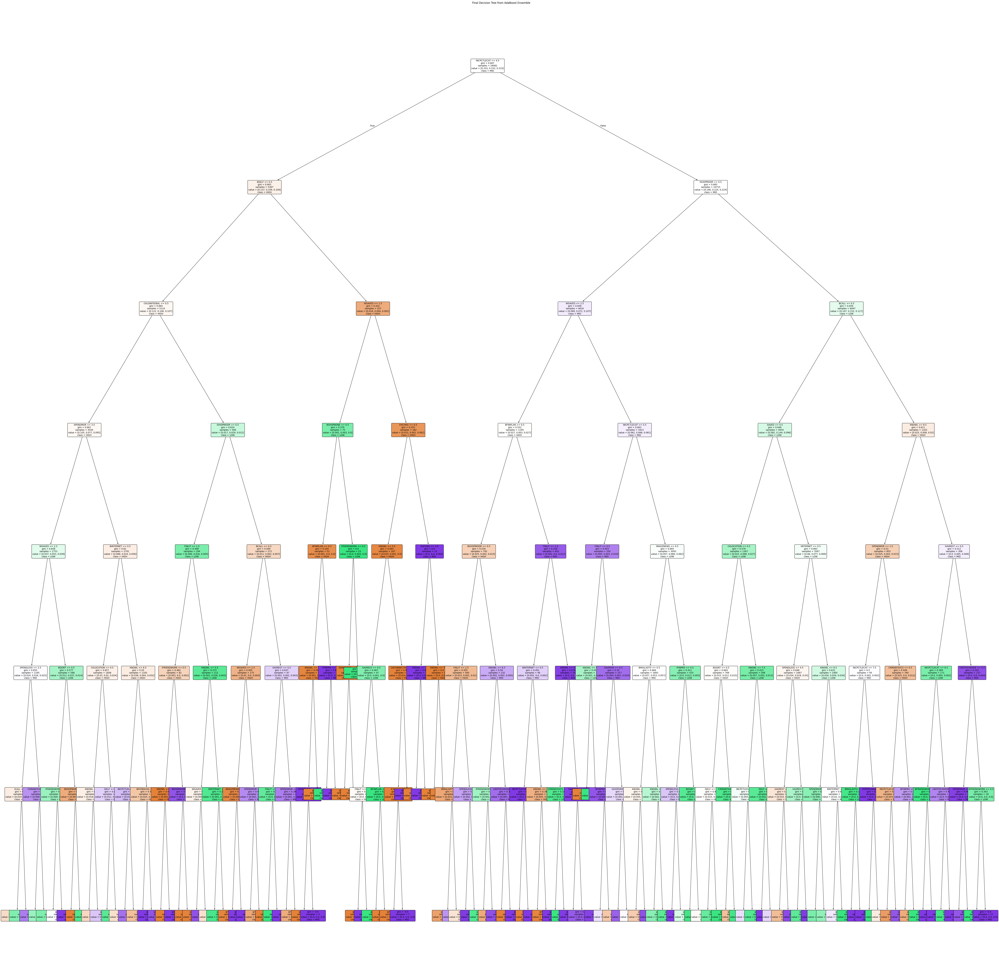

Predicted Original Class Labels:
['HIGH' 'MID' 'HIGH' ... 'MID' 'HIGH' 'MID']

True Original Class Labels:
['HIGH' 'MID' 'HIGH' ... 'MID' 'HIGH' 'MID']


In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# -------------------------------
# Plotting the Final Tree
# -------------------------------

# Get the final estimator (last tree in AdaBoost ensemble)
final_estimator = ada_classifier.estimators_[5]

# Plot the tree
plt.figure(figsize=(80,80))
plot_tree(
    final_estimator,
    feature_names=X.columns,
    class_names=label_encoder.classes_,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title('Final Decision Tree from AdaBoost Ensemble')
plt.show()

# -------------------------------
# Recovering Original Class Labels
# -------------------------------

# Inverse transform the predicted encoded labels
y_pred_original = label_encoder.inverse_transform(y_pred)

# Display the recovered class labels
print("Predicted Original Class Labels:")
print(y_pred_original)

# Inverse transform the true test labels for comparison
y_test_original = label_encoder.inverse_transform(y_test)
print("\nTrue Original Class Labels:")
print(y_test_original)


In [ ]:
from sklearn.tree import _tree
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------
# Extract the Purest Nodes
# -------------------------------

def get_purest_nodes(tree):
    """
    Extract the purest nodes at each depth based on Gini impurity.
    """
    tree_ = tree.tree_
    n_nodes = tree_.node_count
    impurity = tree_.impurity
    children_left = tree_.children_left
    children_right = tree_.children_right

    # Track nodes by depth
    depths = {}
    def collect_depths(node_id=0, depth=0):
        if node_id == -1:
            return
        if depth not in depths:
            depths[depth] = []
        depths[depth].append(node_id)
        collect_depths(children_left[node_id], depth + 1)
        collect_depths(children_right[node_id], depth + 1)

    collect_depths()

    # Find the purest node at each depth
    purest_nodes = []
    for depth, nodes in depths.items():
        purest_node = min(nodes, key=lambda node: impurity[node])
        purest_nodes.append(purest_node)

    return purest_nodes

def prune_tree_for_plot(tree, purest_nodes):
    """
    Prepare the tree for visualization by identifying the paths to the purest nodes.
    """
    tree_ = tree.tree_
    node_indicator = np.zeros(tree_.node_count, dtype=bool)

    def mark_path_to_node(node_id):
        # Mark path recursively back to the root
        if node_id == -1:
            return
        node_indicator[node_id] = True
        parent = np.where((tree_.children_left == node_id) | (tree_.children_right == node_id))[0]
        if len(parent) > 0:
            mark_path_to_node(parent[0])

    for node in purest_nodes:
        mark_path_to_node(node)

    return node_indicator

# -------------------------------
# Prune and Visualize the Tree
# -------------------------------

# Get the purest nodes
purest_nodes = get_purest_nodes(final_estimator)

# Get the path to purest nodes
node_indicator = prune_tree_for_plot(final_estimator, purest_nodes)




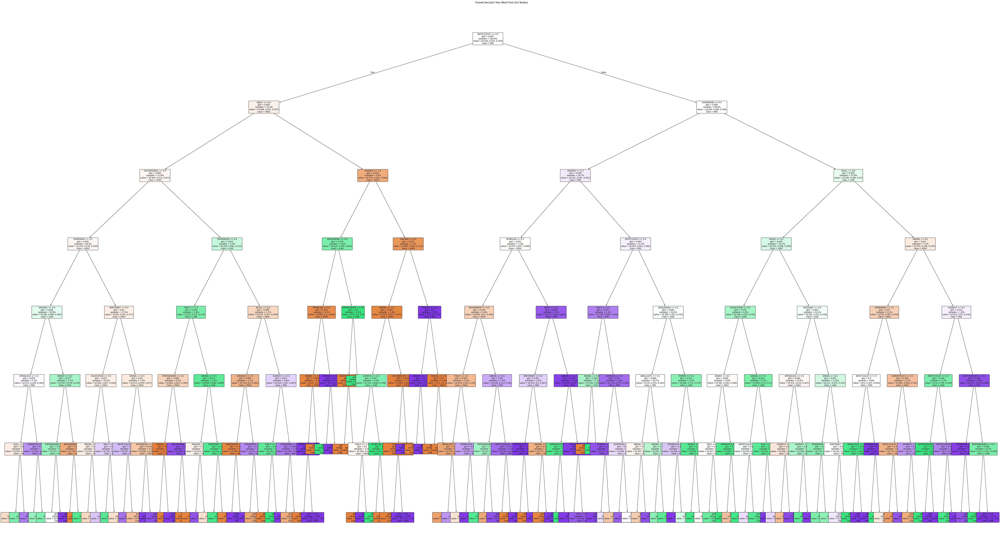

In [ ]:
# Plot only the relevant part of the tree
plt.figure(figsize=(89, 50))
plot_tree(
    final_estimator,
    feature_names=X.columns,
    class_names=label_encoder.classes_,
    filled=True,
    rounded=True,
    fontsize=10,
    proportion=True
)
plt.title('Pruned Decision Tree (Most Pure Gini Nodes)')
plt.show()


In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import numpy as np

def filter_gini(tree, gini_threshold, min_depth):
    """
    Retain only the nodes with Gini index below a given threshold
    after a certain depth and their necessary ancestors.
    Args:
        tree: Trained decision tree object.
        gini_threshold: Maximum Gini index allowed.
        min_depth: Minimum depth to start applying the threshold.
    Returns:
        mask: Boolean mask of nodes to retain.
    """
    tree_structure = tree.tree_
    gini = tree_structure.impurity
    depths = np.zeros(tree_structure.node_count, dtype=int)
    children_left = tree_structure.children_left
    children_right = tree_structure.children_right

    # Calculate depths of all nodes
    def calculate_depths(node_id=0, current_depth=0):
        depths[node_id] = current_depth
        if children_left[node_id] != -1:  # Left child exists
            calculate_depths(children_left[node_id], current_depth + 1)
        if children_right[node_id] != -1:  # Right child exists
            calculate_depths(children_right[node_id], current_depth + 1)

    calculate_depths()

    # Create a mask for nodes meeting the Gini and depth criteria
    mask = np.zeros(tree_structure.node_count, dtype=bool)
    for node_id in range(tree_structure.node_count):
        if depths[node_id] > min_depth and gini[node_id] < gini_threshold:
            mask[node_id] = True

            # Mark all ancestors as needed
            def mark_ancestors(child_id):
                parent = np.where((children_left == child_id) | (children_right == child_id))[0]
                if len(parent) > 0:
                    mask[parent[0]] = True
                    mark_ancestors(parent[0])

            mark_ancestors(node_id)

    return mask

# -------------------------------
# Prune and Visualize the Tree
# -------------------------------

# Filter nodes based on Gini index and depth
gini_threshold = 0.45
min_depth = 3
mask = filter_gini(final_estimator, gini_threshold, min_depth)

# Visualize the pruned tree
plt.figure(figsize=(100, 200))
plot_tree(
    final_estimator,
    feature_names=X.columns,
    class_names=label_encoder.classes_,
    filled=True,
    rounded=True,
    fontsize=10,
    proportion=True
)
plt.title(f'Decision Tree Pruned (Gini < {gini_threshold} after Depth {min_depth})')
plt.show()


In [ ]:
feat_importances_df

,Feature,Importance
0,INCPCTLECAT,0.133248
1,KNOWL,0.099817
35,SPENDLESS,0.066495
34,SPENDMOR,0.060219
2,FINLIT,0.034111
...,...,...
14,CANTMANG,0.000000
13,MINBAL,0.000000
4,CKCONVPAYRL,0.000000
21,OTHER,0.000000


In [ ]:
import graphviz
from sklearn import tree
import matplotlib.pyplot as plt
final_estimator = ada_classifier.estimators_[14]
def plot_pruned_tree(decision_tree, feature_names, class_names, impurity_threshold=0.5, filename='pruned_tree'):
    """
    Plots a decision tree, including only nodes with Gini impurity below the specified threshold.

    Parameters:
    - decision_tree: The decision tree estimator (e.g., from AdaBoost).
    - feature_names: List of feature names.
    - class_names: List of class names.
    - impurity_threshold: Threshold to filter nodes based on Gini impurity.
    - filename: Name of the output file (without extension).
    """
    dot = graphviz.Digraph()

    tree_ = decision_tree.tree_
    feature_name = [
        feature_names[i] if i != tree._tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    def recurse(node, parent=None, edge_label=''):
        # Check if the node's impurity is below the threshold
        if tree_.impurity[node] < impurity_threshold:
            node_id = str(node)
            # Determine the node label
            if tree_.feature[node] != tree._tree.TREE_UNDEFINED:
                name = feature_name[node]
                threshold = tree_.threshold[node]
                label = f"{name} <= {threshold:.2f}\nGini: {tree_.impurity[node]:.2f}"
                shape = 'ellipse'
            else:
                # Leaf node
                value = tree_.value[node]
                class_idx = value.argmax()
                class_label = class_names[class_idx]
                label = f"Leaf\nClass: {class_label}\nGini: {tree_.impurity[node]:.2f}"
                shape = 'box'
            # Add the node to the graph
            dot.node(node_id, label=label, shape=shape)
            # If there's a parent, add an edge
            if parent is not None:
                dot.edge(parent, node_id, label=edge_label)
            # Recurse for left and right children
            if tree_.children_left[node] != tree._tree.TREE_LEAF:
                recurse(tree_.children_left[node], parent=node_id, edge_label='True')
            if tree_.children_right[node] != tree._tree.TREE_LEAF:
                recurse(tree_.children_right[node], parent=node_id, edge_label='False')

    # Start recursion from the root node (0)
    recurse(0)

    # Render the graph to a file and display it
    dot.format = 'png'  # You can choose other formats like 'pdf', 'svg', etc.
    dot.render(filename, view=True)

# Example: Assuming 'X' is your feature DataFrame and 'y_encoded' contains encoded target labels
feature_names = X.columns.tolist()

# If 'y_encoded' is a list or array of encoded labels, map them to their original class names
# For demonstration, let's assume you have a mapping dictionary
# Replace this with your actual class names
class_mapping = {0: 'Class A', 1: 'Class B', 2: 'Class C'}  # Example mapping
class_names = [class_mapping[label] for label in sorted(set(y_encoded))]

# Plot the pruned tree
plot_pruned_tree(
    decision_tree=final_estimator,
    feature_names=feature_names,
    class_names=class_names,
    impurity_threshold=0.5,  # Only include nodes with Gini < 0.5
    filename='pruned_decision_tree'
)



In [ ]:
feat_importances_df
cumulative_importance = feat_importances_df['Importance'].cumsum()
threshold = 0.6  # 80% of total importance
top_features = feat_importances_df[cumulative_importance <= threshold]['Feature'].tolist()

In [ ]:
X_top = X[top_features]

# Split into training and test sets
X_train_top, X_test_top, y_train, y_test = train_test_split(
    X_top, y_encoded, test_size=0.3, random_state=42
)

In [ ]:
from sklearn.linear_model import LogisticRegression

# Initialize the logistic regression model
logistic_model = LogisticRegression(
    multi_class='multinomial',  # Use 'multinomial' for multi-class classification
    solver='lbfgs',              # Solver that supports multi-class
    max_iter=1000000,               # Increase iterations if necessary
    random_state=42
)

# Train the model
logistic_model.fit(X_train_top, y_train)

# Predict on test data
y_pred_logistic = logistic_model.predict(X_test_top)
y_pred_proba_logistic = logistic_model.predict_proba(X_test_top)

# Compute accuracy
accuracy_logistic = accuracy_score(y_test, y_pred_logistic)
print(f'Logistic Regression Accuracy: {accuracy_logistic:.4f}')

# Compute log loss
logloss_logistic = log_loss(y_test, y_pred_proba_logistic)
print(f'Logistic Regression Log Loss: {logloss_logistic:.4f}')

# Classification report
print('\nClassification Report (Logistic Regression):')
print(classification_report(y_test, y_pred_logistic, target_names=label_encoder.classes_))


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Logistic Regression Accuracy: 0.6415
Logistic Regression Log Loss: 0.7745

Classification Report (Logistic Regression):
              precision    recall  f1-score   support

        HIGH       0.78      0.03      0.06      2163
         LOW       0.44      0.02      0.04       356
         MID       0.64      0.99      0.78      4374

    accuracy                           0.64      6893
   macro avg       0.62      0.35      0.29      6893
weighted avg       0.67      0.64      0.52      6893



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## Parameter Tuning

In [ ]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

n_estimators_range = [10, 15, 20, 50, 100, 150]
max_depth_range = [2, 3, 4, 5, 6, 7, 8, 9]

# Initialize lists to store results
results = []

# Loop over parameter combinations
for max_depth in max_depth_range:
    for n_estimators in n_estimators_range:
        # Initialize the base estimator with Gini impurity
        base_estimator = DecisionTreeClassifier(
            criterion='gini', max_depth=max_depth, random_state=42
        )

        # Initialize the AdaBoost classifier
        ada_classifier = AdaBoostClassifier(
            estimator=base_estimator,
            n_estimators=n_estimators,
            random_state=42
        )

        # Train the model
        ada_classifier.fit(X_train, y_train)

        # Predict on test data
        y_pred = ada_classifier.predict(X_test)
        y_pred_proba = ada_classifier.predict_proba(X_test)

        # Compute accuracy
        accuracy = accuracy_score(y_test, y_pred)

        # Compute log loss (cross-entropy loss)
        logloss = log_loss(y_test, y_pred_proba)

        # Store the results
        results.append({
            'max_depth': max_depth,
            'n_estimators': n_estimators,
            'accuracy': accuracy,
            'log_loss': logloss
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# -------------------------------
# Visualization
# -------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

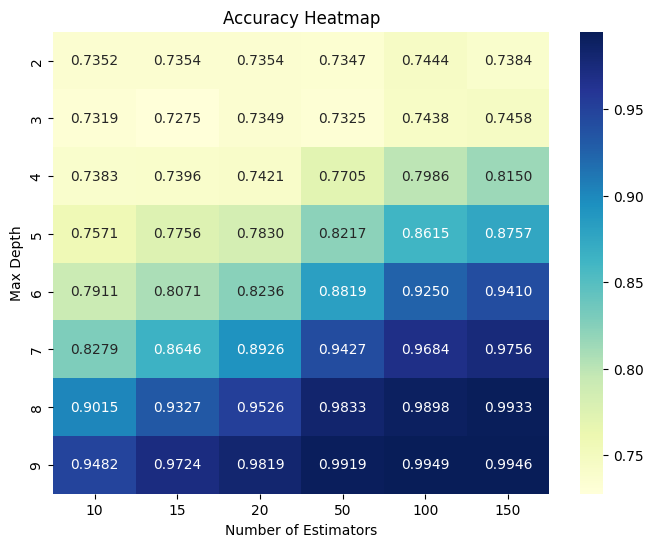

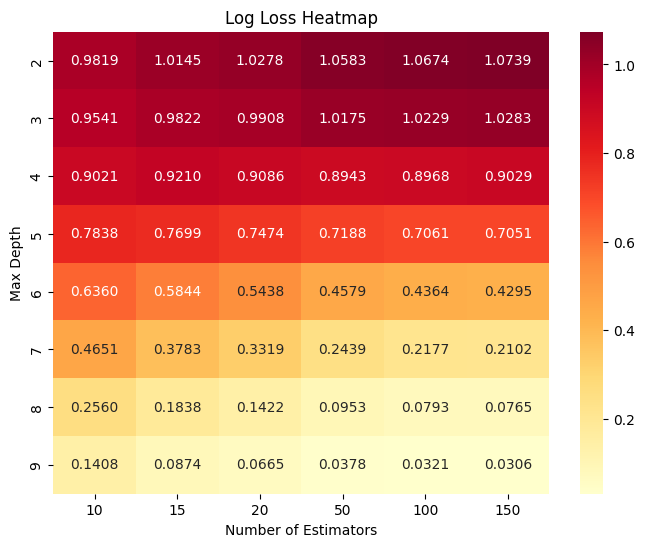

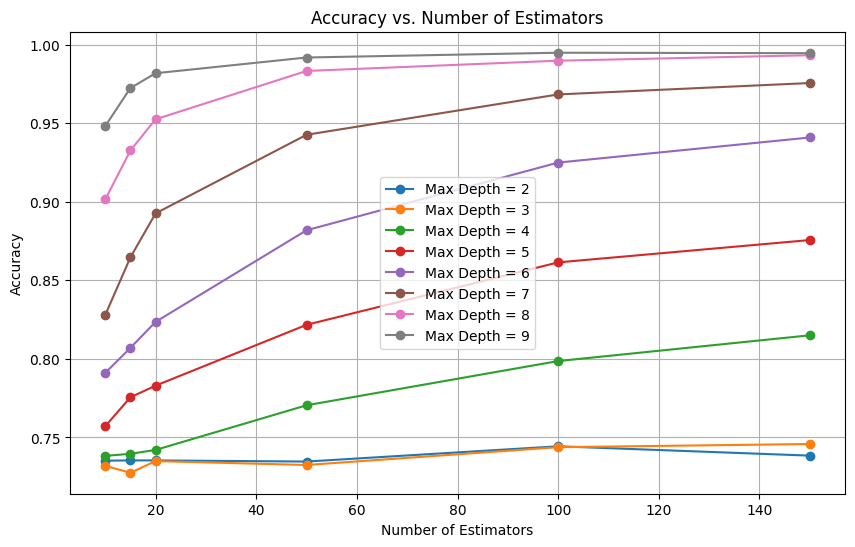

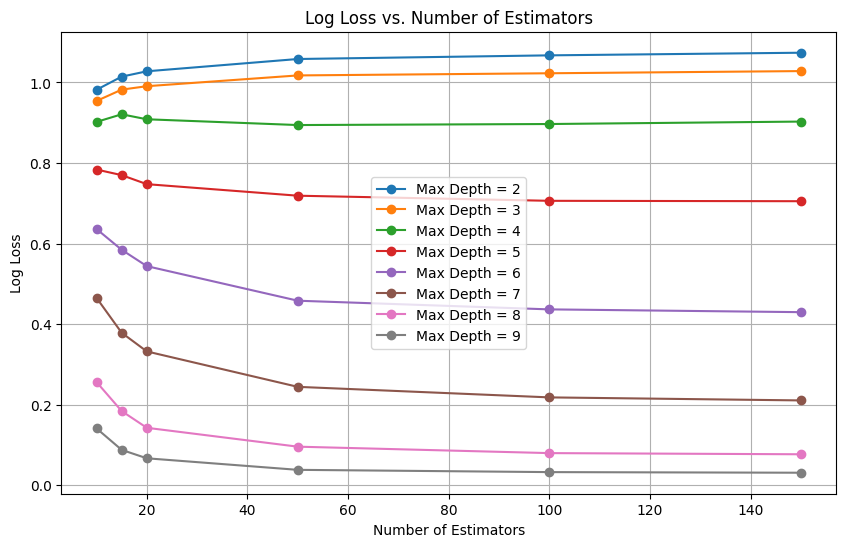

In [ ]:
accuracy_pivot = results_df.pivot(index='max_depth', columns='n_estimators', values='accuracy')
logloss_pivot = results_df.pivot(index='max_depth', columns='n_estimators', values='log_loss')

# Plot heatmap for accuracy
plt.figure(figsize=(8, 6))
sns.heatmap(accuracy_pivot, annot=True, fmt=".4f", cmap='YlGnBu')
plt.title('Accuracy Heatmap')
plt.ylabel('Max Depth')
plt.xlabel('Number of Estimators')
plt.show()

# Plot heatmap for log loss
plt.figure(figsize=(8, 6))
sns.heatmap(logloss_pivot, annot=True, fmt=".4f", cmap='YlOrRd')
plt.title('Log Loss Heatmap')
plt.ylabel('Max Depth')
plt.xlabel('Number of Estimators')
plt.show()

# Plot accuracy vs. n_estimators for each max_depth
plt.figure(figsize=(10, 6))
for max_depth in max_depth_range:
    subset = results_df[results_df['max_depth'] == max_depth]
    plt.plot(
        subset['n_estimators'],
        subset['accuracy'],
        marker='o',
        label=f'Max Depth = {max_depth}'
    )
plt.title('Accuracy vs. Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot log loss vs. n_estimators for each max_depth
plt.figure(figsize=(10, 6))
for max_depth in max_depth_range:
    subset = results_df[results_df['max_depth'] == max_depth]
    plt.plot(
        subset['n_estimators'],
        subset['log_loss'],
        marker='o',
        label=f'Max Depth = {max_depth}'
    )
plt.title('Log Loss vs. Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('Log Loss')
plt.legend()
plt.grid(True)
plt.show()

## Compare vs Previous Years

In [ ]:
file_name_2019 = 'SCFP2019.xlsx'
df_2019 = pd.read_excel(file_name_2019)
#df_2019 = df_2019.drop(columns=['Y1', 'YY1'])


In [ ]:
master_2019 = df_2019[desired_columns]

def calculate_risk_aversion(row):
    if row['YESFINRISK'] == 0 and row['NOFINRISK'] == 1:
        return 'HIGH'
    elif row['YESFINRISK'] == 1 and row['NOFINRISK'] == 0:
        return 'LOW'
    elif row['YESFINRISK'] == 0 and row['NOFINRISK'] == 0:
        return 'MID'
    else:
        return None  # Optional: Handle unexpected cases

# Apply the function to create the RISKAVERSION column
master_2019['RISKAVERSION'] = master_2019.apply(calculate_risk_aversion, axis=1)
master_2019.head()
master_2019 = master_2019.drop(columns=['YESFINRISK','NOFINRISK']) #'WGT','WILSH'
X_2019 = master_2019.drop(columns=['RISKAVERSION'])
y_2019 = master_2019['RISKAVERSION']
X_2019.fillna(0, inplace=True)



<ipython-input-165-8c9c804be609>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  master_2019['RISKAVERSION'] = master_2019.apply(calculate_risk_aversion, axis=1)


In [ ]:
cols_with_nan = X_2019.columns[X_2019.isna().any()].tolist()
print("Columns with NaN values:")
print(cols_with_nan)

Columns with NaN values:
[]


In [ ]:
label_encoder = LabelEncoder()
y_2019 = label_encoder.fit_transform(y_2019)

In [ ]:

y_pred_2019 = ada_classifier.predict(X_2019)
y_pred_proba_2019 = ada_classifier.predict_proba(X_2019)

# Compute accuracy
accuracy = accuracy_score(y_2019, y_pred_2019)
print(f'Accuracy: {accuracy:.4f}')

# Compute log loss (cross-entropy loss)
logloss = log_loss(y_2019, y_pred_proba_2019)
print(f'Log Loss (Cross-Entropy Loss): {logloss:.4f}')

# Display classification report
print('\nClassification Report:')
print(classification_report(y_2019, y_pred_2019, target_names=label_encoder.classes_))

Accuracy: 0.6765
Log Loss (Cross-Entropy Loss): 0.9571

Classification Report:
              precision    recall  f1-score   support

        HIGH       0.56      0.54      0.55      9137
         LOW       0.12      0.04      0.06      1435
         MID       0.74      0.79      0.77     18313

    accuracy                           0.68     28885
   macro avg       0.47      0.46      0.46     28885
weighted avg       0.65      0.68      0.66     28885



In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score, log_loss, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Split into training and test sets
X_train = master_df.drop(columns=['RISKAVERSION', 'NOFINRISK', 'YESFINRISK'])
X_train = X_train.to_numpy()
y_train = master_df['RISKAVERSION']
y_train = y_train.to_numpy()
X_test = X_2019.to_numpy()
y_test = y_2019.to_numpy()

# ---------------------------------------
# Classification Setup (if RISKAVERSION is categorical)
# ---------------------------------------
# Uncomment this block if RISKAVERSION represents discrete categories.

# # Convert target variable to discrete categories (if applicable)
# y_train = pd.cut(master_df['RISKAVERSION'], bins=[-float('inf'), 0.5, 1.5, float('inf')], labels=[0, 1, 2])
# y_train = y_train.astype(int)  # Ensure integer labels

# y_test = pd.cut(y_2019, bins=[-float('inf'), 0.5, 1.5, float('inf')], labels=[0, 1, 2])
# y_test = y_test.astype(int)

# # Initialize the base estimator with Gini impurity
# base_estimator = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=42)

# # Initialize the AdaBoost classifier
# ada_classifier = AdaBoostClassifier(
#     estimator=base_estimator,
#     n_estimators=50,
#     random_state=42
# )

# # Train the model
# ada_classifier.fit(X_train, y_train)

# # Predict on test data
# y_pred = ada_classifier.predict(X_test)
# y_pred_proba = ada_classifier.predict_proba(X_test)

# # Compute accuracy
# accuracy = accuracy_score(y_test, y_pred)
# print(f'Accuracy: {accuracy:.4f}')

# # Compute log loss (cross-entropy loss)
# logloss = log_loss(y_test, y_pred_proba)
# print(f'Log Loss (Cross-Entropy Loss): {logloss:.4f}')

# # ---------------------------------------
# # Regression Setup (if RISKAVERSION is continuous)
# ---------------------------------------
# Uncomment this block if RISKAVERSION represents continuous values.

# Initialize the base estimator for regression
base_estimator = DecisionTreeRegressor(max_depth=5, random_state=42)

# Initialize the AdaBoost regressor
ada_regressor = AdaBoostRegressor(
    base_estimator=base_estimator,
    n_estimators=50,
    random_state=42
)

# Train the model
ada_regressor.fit(X_train, y_train)

# Predict on test data
y_pred = ada_regressor.predict(X_test)

# Evaluate regression performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R^2 Score: {r2:.4f}')

# ---------------------------------------
# Feature Importance Visualization
# ---------------------------------------

# Get feature importances (works for both classifiers and regressors)
feature_importances = ada_regressor.feature_importances_

# Create a dataframe for feature importances
feat_importances_df = pd.DataFrame({
    'Feature': master_df.drop(columns=['RISKAVERSION', 'NOFINRISK', 'YESFINRISK']).columns,
    'Importance': feature_importances
})

# Sort the dataframe by importance
feat_importances_df = feat_importances_df.sort_values('Importance', ascending=False)

# Plot the top 20 features
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feat_importances_df.head(20))
plt.title('Top 20 Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.tight_layout()
plt.show()


AttributeError: 'numpy.ndarray' object has no attribute 'to_numpy'

In [ ]:
y_2019

array([2, 2, 2, ..., 0, 0, 0])